# K-Means con Embeddings

En la clase anterior aplicamos K-Means directamente sobre los **píxeles crudos** de las imágenes (dataset Olivetti). En esta clase exploraremos cómo una **red neuronal pre-entrenada** puede transformar imágenes en vectores latentes llamados *embeddings*, y cómo esos vectores permiten que K-Means agrupe los datos de forma más significativa.

**Idea central**: todo puede convertirse en un vector numérico. Una vez que tenemos vectores, podemos medir distancias y aplicar clustering.

In [1]:
!pip install transformers torch Pillow tqdm scikit-learn kneed -q

import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from PIL import Image
from tqdm.auto import tqdm
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
from kneed import KneeLocator
import torch
from transformers import CLIPProcessor, CLIPModel
import warnings
warnings.filterwarnings('ignore')

print('Librerías importadas correctamente.')

/home/toopazo/Dropbox/tomas/repos_git/biy7121_mindatos/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Librerías importadas correctamente.


---
## Parte 1: Freiburg Groceries Dataset

### 1.1 Descarga y exploración del dataset

El [Freiburg Groceries Dataset](http://aisdatasets.informatik.uni-freiburg.de/freiburg_groceries_dataset/) contiene imágenes de productos de supermercado organizadas en 25 categorías. Usaremos **15 de ellas con 20 imágenes cada una (300 imágenes en total)**.

Estructura de carpetas (visible en el explorador de archivos de Colab, a la izquierda):
```
freiburg_groceries_dataset/images/
├── PASTA/          ← fideos (distintas marcas)
├── SODA/           ← bebidas en lata y botella
├── MILK/           ← leches en tetrapack
└── ...             (25 carpetas, usamos 15)
```

In [2]:
# ──────────────────────────────────────────────────────────────────────
# OPCIÓN A — local (preparación / revisión del profesor)
# OPCIÓN B — Colab (clase con alumnos): descomentar bloque de gdown
# ──────────────────────────────────────────────────────────────────────

# OPCIÓN A: ruta local ← activa por defecto
dataset_path = Path('/home/toopazo/Dropbox/tomas/trabajo_duoc/AAA_datos/freiburg_groceries_dataset/images')

# OPCIÓN B: Google Drive (descomentar para usar en Colab)
# !pip install gdown -q
# import gdown
# DRIVE_FILE_ID = 'REEMPLAZAR_CON_EL_FILE_ID'
# gdown.download(f'https://drive.google.com/uc?id={DRIVE_FILE_ID}', 'subset.zip', quiet=False)
# !unzip -q subset.zip -d freiburg_groceries
# dataset_path = Path('freiburg_groceries')

# Categorías a usar en la demo (15 de las 25 disponibles)
CATEGORIAS_DEMO = [
    'BEANS', 'CANDY', 'CEREAL', 'CHIPS', 'CHOCOLATE',
    'COFFEE', 'HONEY', 'JAM', 'JUICE', 'MILK',
    'OIL', 'PASTA', 'RICE', 'SODA', 'SUGAR'
]

MAX_IMG = 20   # imágenes por categoría

print(f'Dataset en: {dataset_path}')
print(f'Categorías: {len(CATEGORIAS_DEMO)}  ×  {MAX_IMG} imágenes = {len(CATEGORIAS_DEMO) * MAX_IMG} total')

Dataset en: /home/toopazo/Dropbox/tomas/trabajo_duoc/AAA_datos/freiburg_groceries_dataset/images
Categorías: 15  ×  20 imágenes = 300 total


In [3]:
# Exploramos las imágenes disponibles por categoría
print('Imágenes disponibles  (usaremos las primeras MAX_IMG de cada una):\n')
for cat in CATEGORIAS_DEMO:
    imgs = (list((dataset_path / cat).glob('*.jpg')) +
            list((dataset_path / cat).glob('*.png')))
    print(f'  {cat:<22} {len(imgs):>3} disponibles  →  usamos {min(MAX_IMG, len(imgs))}')

Imágenes disponibles  (usaremos las primeras MAX_IMG de cada una):

  BEANS                  136 disponibles  →  usamos 20
  CANDY                  372 disponibles  →  usamos 20
  CEREAL                 278 disponibles  →  usamos 20
  CHIPS                  181 disponibles  →  usamos 20
  CHOCOLATE              307 disponibles  →  usamos 20
  COFFEE                 298 disponibles  →  usamos 20
  HONEY                  185 disponibles  →  usamos 20
  JAM                    241 disponibles  →  usamos 20
  JUICE                  302 disponibles  →  usamos 20
  MILK                   162 disponibles  →  usamos 20
  OIL                    143 disponibles  →  usamos 20
  PASTA                  172 disponibles  →  usamos 20
  RICE                   150 disponibles  →  usamos 20
  SODA                   177 disponibles  →  usamos 20
  SUGAR                  118 disponibles  →  usamos 20


In [4]:
# Cargamos todas las rutas de imágenes y sus etiquetas reales
all_paths  = []
all_labels = []

for cat in CATEGORIAS_DEMO:
    imgs = sorted(
        list((dataset_path / cat).glob('*.jpg')) +
        list((dataset_path / cat).glob('*.png'))
    )[:MAX_IMG]
    all_paths.extend(imgs)
    all_labels.extend([cat] * len(imgs))

label_encoder     = LabelEncoder()
labels_verdaderos = label_encoder.fit_transform(all_labels)

categories = CATEGORIAS_DEMO   # alias usado en el resto del notebook

print(f'Total imágenes cargadas: {len(all_paths)}')
print(f'Total categorías: {len(categories)}')

Total imágenes cargadas: 300
Total categorías: 15


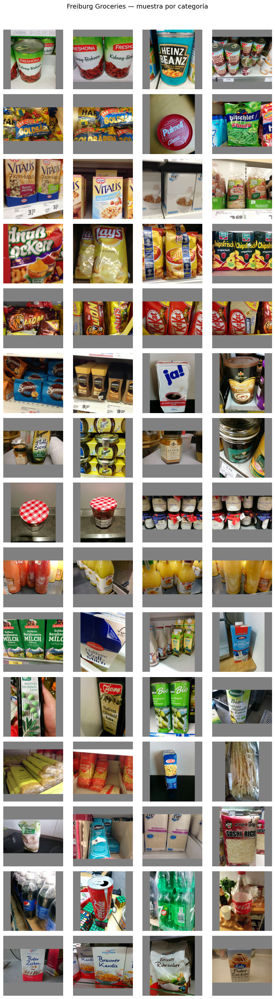

In [5]:
# Mostramos 4 imágenes de cada categoría
N_MUESTRA = 4
fig, axes = plt.subplots(len(categories), N_MUESTRA,
                         figsize=(N_MUESTRA * 2.2, len(categories) * 2.0))
fig.suptitle('Freiburg Groceries — muestra por categoría', fontsize=14, y=1.01)

for i, cat in enumerate(categories):
    imgs = sorted(
        list((dataset_path / cat).glob('*.jpg')) +
        list((dataset_path / cat).glob('*.png'))
    )[:N_MUESTRA]
    for j in range(N_MUESTRA):
        ax = axes[i, j]
        if j < len(imgs):
            ax.imshow(Image.open(imgs[j]).convert('RGB'))
        ax.axis('off')
        if j == 0:
            ax.set_ylabel(cat, rotation=0, labelpad=80,
                          va='center', fontsize=8, fontweight='bold')

plt.tight_layout()
plt.show()

### 1.2 ¿Qué es un embedding?

Una red neuronal puede verse como una función que **transforma** una imagen en una serie de representaciones internas, cada vez más abstractas:

```
Imagen  (224 × 224 × 3 = 150.528 valores)
    ↓  capa convolucional  →  detecta bordes
    ↓  capa convolucional  →  detecta texturas
    ↓  capa convolucional  →  detecta formas y objetos
    ↓  capa fully-connected
Vector latente  (512 valores)   ← embedding
```

El **vector latente** (o embedding) captura el *significado* de la imagen, no sus píxeles. Dos fotos de fideos tendrán vectores similares aunque los píxeles sean distintos.

**CLIP** (Contrastive Language-Image Pre-Training, OpenAI) fue entrenado con millones de pares *(imagen, descripción textual)*. Aprendió a proyectar imágenes en un espacio vectorial donde cosas visualmente similares quedan cercanas. Nosotros lo usamos como **extractor de features**: le pasamos una imagen y nos devuelve un vector de 512 números.

In [6]:
# Cargamos el modelo CLIP (ViT-B/32) desde HuggingFace
# Primera vez: descarga ~350 MB. Las siguientes usa caché local.
print('Cargando modelo CLIP (ViT-B/32)...')
MODEL_NAME     = 'openai/clip-vit-base-patch32'
clip_processor = CLIPProcessor.from_pretrained(MODEL_NAME)
clip_model     = CLIPModel.from_pretrained(MODEL_NAME)
clip_model.eval()

device     = 'cuda' if torch.cuda.is_available() else 'cpu'
clip_model = clip_model.to(device)

print(f'Modelo listo  →  dispositivo: {device.upper()}')
print(f'Parámetros:   {sum(p.numel() for p in clip_model.parameters()):,}')

Cargando modelo CLIP (ViT-B/32)...


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

Loading weights: 100%|██████████| 398/398 [00:00<00:00, 39701.60it/s]

Modelo listo  →  dispositivo: CPU
Parámetros:   151,277,313


ENTRADA:
  Imagen 'BEANS0000.png' — categoría: BEANS
  Tamaño: 256×256 px
  Como array numpy: shape (256, 256, 3)
  Número total de valores: 196,608

SALIDA (embedding CLIP):
  Shape: (1, 512)  →  1 imagen × 512 dimensiones

Primeros 10 valores del vector:
[-0.0055 -0.0761  0.0056 -0.0007  0.069   0.0619 -0.0441  0.01   -0.0105
  0.0297]


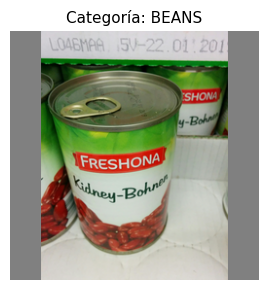

In [7]:
# Demostramos qué hace CLIP con UNA sola imagen
muestra_path = all_paths[0]
muestra_img  = Image.open(muestra_path).convert('RGB')

print('ENTRADA:')
print(f"  Imagen '{muestra_path.name}' — categoría: {all_labels[0]}")
print(f'  Tamaño: {muestra_img.size[0]}×{muestra_img.size[1]} px')
print(f'  Como array numpy: shape {np.array(muestra_img).shape}')
print(f'  Número total de valores: {np.array(muestra_img).size:,}\n')

inputs = clip_processor(images=muestra_img, return_tensors='pt').to(device)
with torch.no_grad():
    raw   = clip_model.get_image_features(pixel_values=inputs['pixel_values'])
    feats = raw if isinstance(raw, torch.Tensor) else raw.pooler_output
    feats = feats / feats.norm(dim=-1, keepdim=True)   # normalización L2

print('SALIDA (embedding CLIP):')
print(f'  Shape: {tuple(feats.shape)}  →  1 imagen × 512 dimensiones')
print(f'\nPrimeros 10 valores del vector:')
print(np.round(feats[0, :10].cpu().numpy(), 4))

fig, ax = plt.subplots(figsize=(3, 3))
ax.imshow(muestra_img)
ax.set_title(f'Categoría: {all_labels[0]}', fontsize=11)
ax.axis('off')
plt.tight_layout()
plt.show()

In [8]:
def extraer_embeddings(imagenes, processor, model, device, batch_size=16):
    """
    imagenes : lista de Path o lista de PIL Image
    retorna  : ndarray (N, 512) con embeddings normalizados
    """
    embeddings = []
    for i in tqdm(range(0, len(imagenes), batch_size), desc='Extrayendo embeddings'):
        batch = imagenes[i : i + batch_size]
        if isinstance(batch[0], (str, Path)):
            batch = [Image.open(p).convert('RGB') for p in batch]
        inputs = processor(images=batch, return_tensors='pt', padding=True).to(device)
        with torch.no_grad():
            raw   = model.get_image_features(pixel_values=inputs['pixel_values'])
            feats = raw if isinstance(raw, torch.Tensor) else raw.pooler_output
            feats = feats / feats.norm(dim=-1, keepdim=True)
        embeddings.append(feats.cpu().numpy())
    return np.vstack(embeddings)


# Extraemos embeddings de las 300 imágenes
# (~3-5 minutos en CPU, ~30 segundos en GPU)
print('Extrayendo embeddings CLIP para todas las imágenes...')
embeddings_groceries = extraer_embeddings(
    all_paths, clip_processor, clip_model, device
)

print(f'\nMatriz de embeddings: {embeddings_groceries.shape}')
print(f'  {embeddings_groceries.shape[0]} imágenes  ×  {embeddings_groceries.shape[1]} dimensiones')

Extrayendo embeddings CLIP para todas las imágenes...


Extrayendo embeddings:   0%|          | 0/19 [00:00<?, ?it/s]

Extrayendo embeddings:   5%|▌         | 1/19 [00:00<00:12,  1.43it/s]

Extrayendo embeddings:  11%|█         | 2/19 [00:01<00:12,  1.40it/s]

Extrayendo embeddings:  16%|█▌        | 3/19 [00:02<00:11,  1.39it/s]

Extrayendo embeddings:  21%|██        | 4/19 [00:02<00:10,  1.41it/s]

Extrayendo embeddings:  26%|██▋       | 5/19 [00:03<00:10,  1.37it/s]

Extrayendo embeddings:  32%|███▏      | 6/19 [00:04<00:09,  1.39it/s]

Extrayendo embeddings:  37%|███▋      | 7/19 [00:05<00:08,  1.37it/s]

Extrayendo embeddings:  42%|████▏     | 8/19 [00:05<00:07,  1.38it/s]

Extrayendo embeddings:  47%|████▋     | 9/19 [00:06<00:07,  1.39it/s]

Extrayendo embeddings:  53%|█████▎    | 10/19 [00:07<00:06,  1.37it/s]

Extrayendo embeddings:  58%|█████▊    | 11/19 [00:07<00:05,  1.37it/s]

Extrayendo embeddings:  63%|██████▎   | 12/19 [00:08<00:05,  1.36it/s]

Extrayendo embeddings:  68%|██████▊   | 13/19 [00:09<00:04,  1.37it/s]

Extrayendo embeddings:  74%|███████▎  | 14/19 [00:10<00:03,  1.42it/s]

Extrayendo embeddings:  79%|███████▉  | 15/19 [00:10<00:02,  1.48it/s]

Extrayendo embeddings:  84%|████████▍ | 16/19 [00:11<00:01,  1.54it/s]

Extrayendo embeddings:  89%|████████▉ | 17/19 [00:12<00:01,  1.48it/s]

Extrayendo embeddings:  95%|█████████▍| 18/19 [00:12<00:00,  1.47it/s]

Extrayendo embeddings: 100%|██████████| 19/19 [00:13<00:00,  1.55it/s]

Extrayendo embeddings: 100%|██████████| 19/19 [00:13<00:00,  1.43it/s]


Matriz de embeddings: (300, 512)
  300 imágenes  ×  512 dimensiones


### 1.3 Visualización del espacio latente con t-SNE

Para visualizar vectores de alta dimensión (512 valores) en 2D usamos **t-SNE**: un algoritmo que proyecta los puntos intentando preservar las distancias relativas entre ellos.

Vamos a comparar dos representaciones del mismo dataset:
- **Píxeles crudos**: cada imagen como un vector de valores RGB (64×64×3 = 12.288 valores)
- **Embeddings CLIP**: el vector latente de 512 valores

Si los embeddings capturan bien la semántica, los puntos del mismo color (misma categoría) deberían quedar agrupados.

In [9]:
# Representación en píxeles crudos
# Redimensionamos a 64×64 para mantener las dimensiones manejables
PIXEL_SIZE = 64
print(f'Construyendo representación en píxeles ({PIXEL_SIZE}×{PIXEL_SIZE}×3)...')

pixeles_groceries = []
for path in tqdm(all_paths, desc='Cargando píxeles'):
    img = Image.open(path).convert('RGB').resize((PIXEL_SIZE, PIXEL_SIZE))
    pixeles_groceries.append(np.array(img).flatten() / 255.0)

pixeles_groceries = np.array(pixeles_groceries)
print(f'Matriz de píxeles: {pixeles_groceries.shape}')
print(f'  {pixeles_groceries.shape[0]} imágenes  ×  {pixeles_groceries.shape[1]:,} valores por imagen')

Construyendo representación en píxeles (64×64×3)...


Cargando píxeles:   0%|          | 0/300 [00:00<?, ?it/s]

Cargando píxeles:  13%|█▎        | 40/300 [00:00<00:00, 393.10it/s]

Cargando píxeles:  27%|██▋       | 80/300 [00:00<00:00, 372.76it/s]

Cargando píxeles:  41%|████      | 123/300 [00:00<00:00, 395.71it/s]

Cargando píxeles:  57%|█████▋    | 170/300 [00:00<00:00, 421.59it/s]

Cargando píxeles:  71%|███████   | 213/300 [00:00<00:00, 423.73it/s]

Cargando píxeles:  86%|████████▋ | 259/300 [00:00<00:00, 432.93it/s]

Cargando píxeles: 100%|██████████| 300/300 [00:00<00:00, 420.08it/s]

Matriz de píxeles: (300, 12288)
  300 imágenes  ×  12,288 valores por imagen


In [10]:
# Calculamos t-SNE para ambas representaciones (~1-2 minutos)
print('Calculando t-SNE sobre píxeles crudos...')
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
tsne_pixeles = tsne.fit_transform(pixeles_groceries)

print('Calculando t-SNE sobre embeddings CLIP...')
tsne_emb = tsne.fit_transform(embeddings_groceries)

print('Listo.')

Calculando t-SNE sobre píxeles crudos...


Calculando t-SNE sobre embeddings CLIP...


Listo.


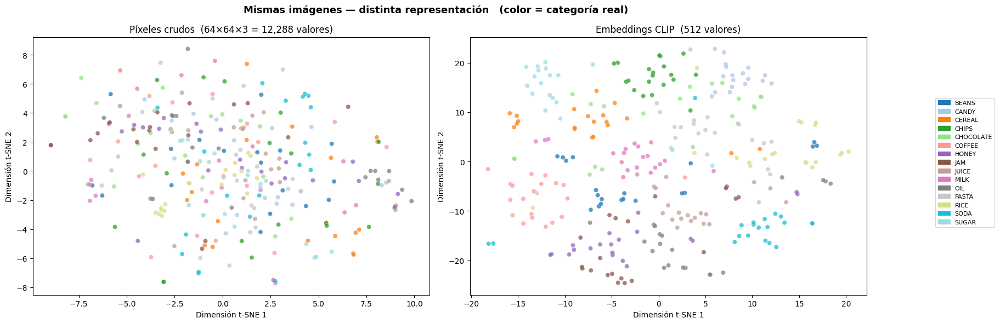

In [11]:
# Un color por categoría
colores    = plt.cm.tab20(np.linspace(0, 1, len(categories)))
color_map  = {cat: colores[i] for i, cat in enumerate(categories)}
ptos_color = [color_map[label] for label in all_labels]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

ax1.scatter(tsne_pixeles[:, 0], tsne_pixeles[:, 1],
            c=ptos_color, alpha=0.75, s=35, edgecolors='white', linewidths=0.3)
ax1.set_title(f'Píxeles crudos  ({PIXEL_SIZE}×{PIXEL_SIZE}×3 = {pixeles_groceries.shape[1]:,} valores)',
              fontsize=12)
ax1.set_xlabel('Dimensión t-SNE 1')
ax1.set_ylabel('Dimensión t-SNE 2')

ax2.scatter(tsne_emb[:, 0], tsne_emb[:, 1],
            c=ptos_color, alpha=0.75, s=35, edgecolors='white', linewidths=0.3)
ax2.set_title('Embeddings CLIP  (512 valores)', fontsize=12)
ax2.set_xlabel('Dimensión t-SNE 1')
ax2.set_ylabel('Dimensión t-SNE 2')

handles = [mpatches.Patch(color=color_map[cat], label=cat) for cat in categories]
fig.legend(handles=handles, loc='center right',
           bbox_to_anchor=(1.14, 0.5), fontsize=8)

fig.suptitle('Mismas imágenes — distinta representación   (color = categoría real)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### 1.4 K-Means sobre embeddings

Ahora aplicamos el **mismo algoritmo K-Means de la clase anterior**, pero en lugar de darle los píxeles crudos le damos los embeddings CLIP.

Usamos el método del codo para elegir *k*, sin asumir que sabemos de antemano cuántas categorías hay.

In [12]:
# Calculamos SSE para k = 1 ... 25
print('Calculando SSE para k = 1 ... 25  (~2-3 minutos)...')
sse     = []
k_rango = range(1, 26)

for k in tqdm(k_rango, desc='K-Means'):
    km = KMeans(n_clusters=k, random_state=42, n_init=5)
    km.fit(embeddings_groceries)
    sse.append(km.inertia_)

kl     = KneeLocator(list(k_rango), sse, curve='convex', direction='decreasing')
k_codo = kl.elbow
print(f'\nCodo detectado en k = {k_codo}   (número real de categorías = {len(categories)})')

Calculando SSE para k = 1 ... 25  (~2-3 minutos)...


K-Means:   0%|          | 0/25 [00:00<?, ?it/s]

K-Means:  32%|███▏      | 8/25 [00:00<00:00, 66.44it/s]

K-Means:  60%|██████    | 15/25 [00:00<00:00, 43.54it/s]

K-Means:  80%|████████  | 20/25 [00:00<00:00, 35.04it/s]

K-Means:  96%|█████████▌| 24/25 [00:00<00:00, 29.45it/s]

K-Means: 100%|██████████| 25/25 [00:00<00:00, 33.03it/s]


Codo detectado en k = 11   (número real de categorías = 15)


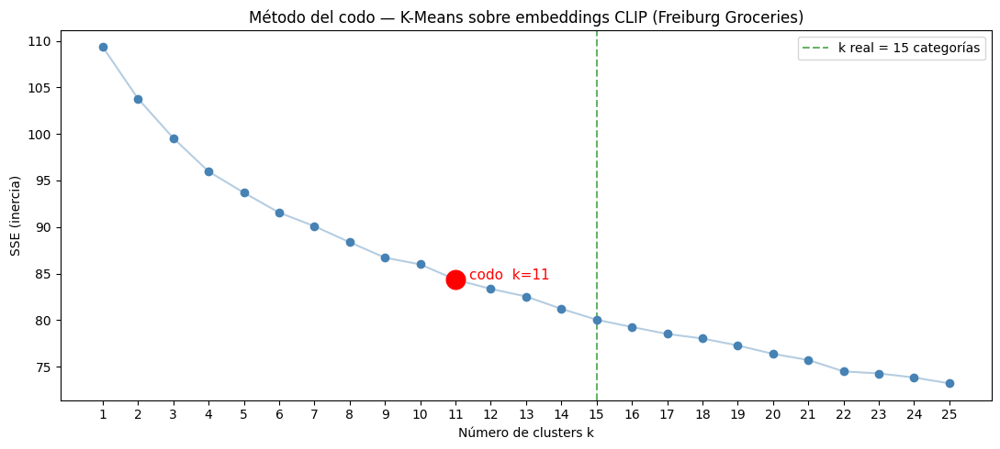

In [13]:
fig, ax = plt.subplots(figsize=(11, 5))

ax.scatter(list(k_rango), sse, color='steelblue', zorder=3)
ax.plot(list(k_rango), sse, color='steelblue', alpha=0.4)
ax.scatter(k_codo, sse[k_codo - 1], color='red', s=220, zorder=5)
ax.text(k_codo + 0.4, sse[k_codo - 1], f'codo  k={k_codo}', fontsize=11, color='red')
ax.axvline(x=len(categories), color='green', linestyle='--', alpha=0.6,
           label=f'k real = {len(categories)} categorías')

ax.set_xlabel('Número de clusters k')
ax.set_ylabel('SSE (inercia)')
ax.set_title('Método del codo — K-Means sobre embeddings CLIP (Freiburg Groceries)')
ax.set_xticks(list(k_rango))
ax.legend()
plt.tight_layout()
plt.show()

In [14]:
# Ajustamos K-Means con k = k_codo
kmeans_groceries = KMeans(n_clusters=k_codo, random_state=42, n_init=10)
kmeans_groceries.fit(embeddings_groceries)
labels_kmeans = kmeans_groceries.labels_

print(f'K-Means entrenado con k = {k_codo}\n')
print('Distribución de imágenes por cluster:')
unicos, conteos = np.unique(labels_kmeans, return_counts=True)
for u, c in zip(unicos, conteos):
    print(f'  Cluster {u:2d}: {c:>3} imágenes')

K-Means entrenado con k = 11

Distribución de imágenes por cluster:
  Cluster  0:  11 imágenes
  Cluster  1:  26 imágenes
  Cluster  2:  23 imágenes
  Cluster  3:  19 imágenes
  Cluster  4:  21 imágenes
  Cluster  5:  27 imágenes
  Cluster  6:  32 imágenes
  Cluster  7:  35 imágenes
  Cluster  8:  27 imágenes
  Cluster  9:  33 imágenes
  Cluster 10:  46 imágenes


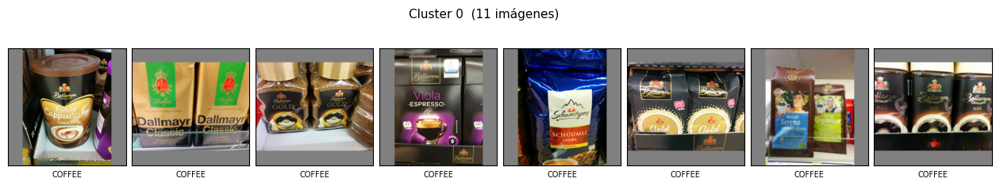

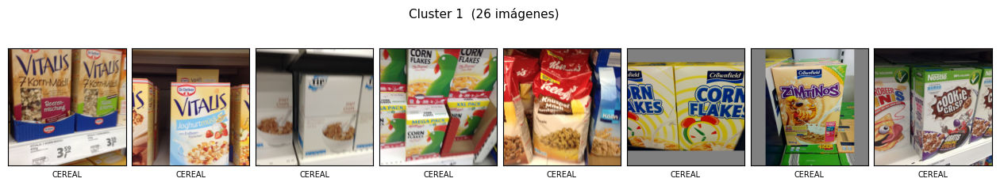

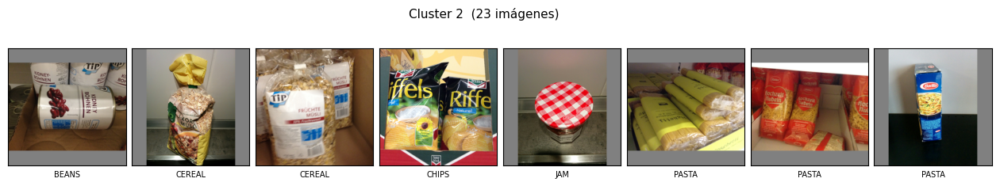

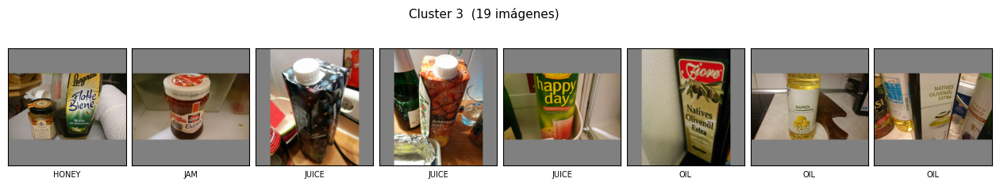

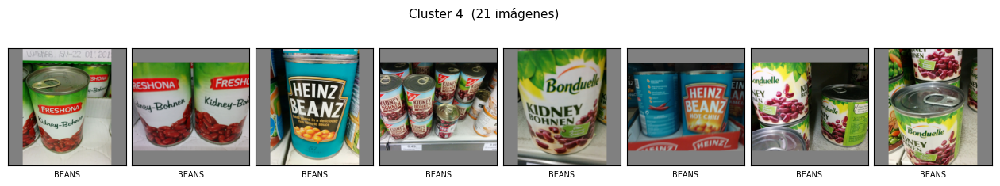

...

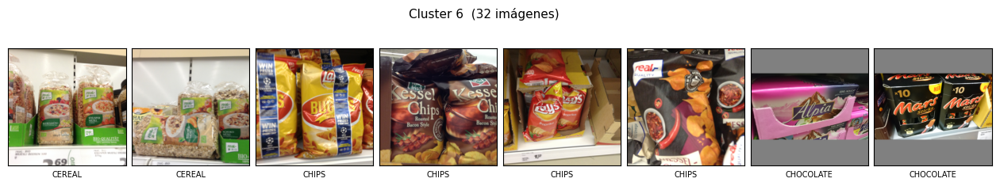

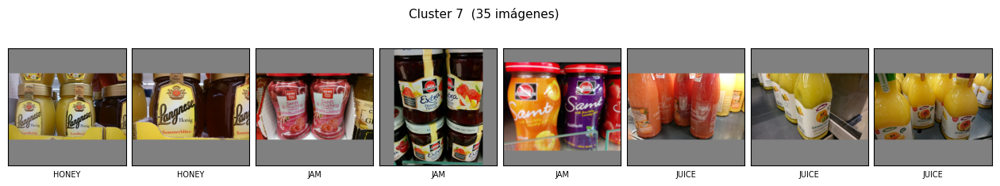

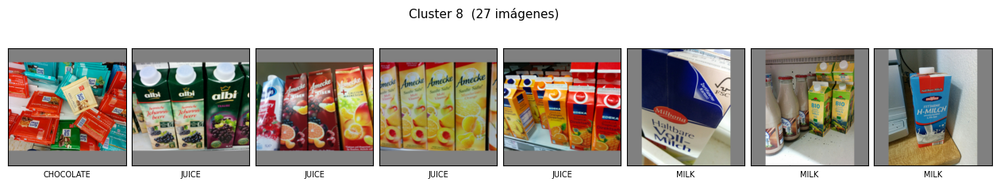

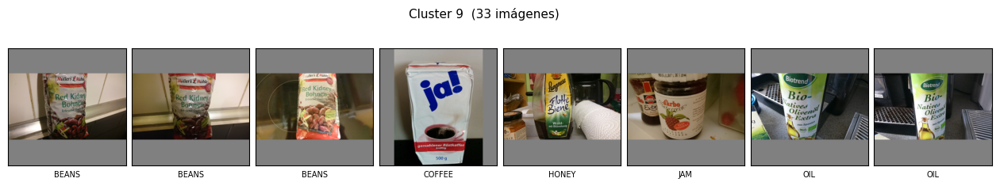

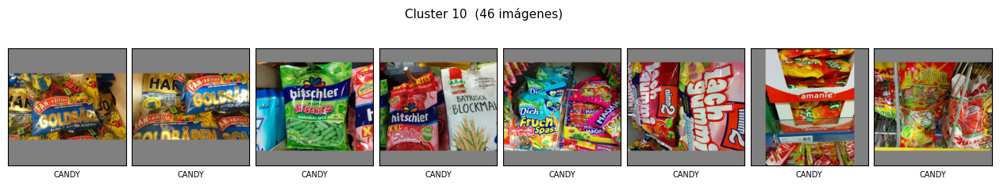

In [15]:
def mostrar_cluster_groceries(cluster_id, labels, paths, img_labels, n_cols=8):
    idx = np.where(labels == cluster_id)[0]
    if len(idx) == 0:
        return
    n_show = min(n_cols, len(idx))
    fig, axes = plt.subplots(1, n_show,
                             figsize=(n_show * 2.0, 2.6),
                             subplot_kw={'xticks': [], 'yticks': []},
                             gridspec_kw={'wspace': 0.05})
    fig.suptitle(f'Cluster {cluster_id}  ({len(idx)} imágenes)', fontsize=11)
    if n_show == 1:
        axes = [axes]
    for j, ax in enumerate(axes):
        ax.imshow(Image.open(paths[idx[j]]).convert('RGB'))
        ax.set_xlabel(img_labels[idx[j]], fontsize=7)
    plt.show()


# Mostramos todos los clusters
for cid in range(k_codo):
    mostrar_cluster_groceries(cid, labels_kmeans, all_paths, all_labels)

---
## Parte 2: Revisitando Olivetti — ¿mejoran los embeddings?

En la clase anterior aplicamos K-Means sobre los **píxeles crudos** de las caras Olivetti (400 fotos, 40 personas) y los clusters quedaron imperfectos. Ahora vamos a repetir el experimento usando **embeddings CLIP** y comparar los resultados con una métrica objetiva.

**Adjusted Rand Index (ARI)**: mide qué tan parecida es la asignación de clusters al *ground truth* (las etiquetas reales de cada persona).
- ARI = 1.0 → clustering perfecto  
- ARI ≈ 0.0 → asignación aleatoria

In [16]:
from sklearn.datasets import fetch_olivetti_faces

data_olivetti, targets_olivetti = fetch_olivetti_faces(return_X_y=True)
print(f'Dimensión de los datos Olivetti: {data_olivetti.shape}')
print(f'  {data_olivetti.shape[0]} fotos de {np.unique(targets_olivetti).shape[0]} personas')
print(f'  {data_olivetti.shape[1]} píxeles por foto (64×64 = 4.096)')

Dimensión de los datos Olivetti: (400, 4096)
  400 fotos de 40 personas
  4096 píxeles por foto (64×64 = 4.096)


### 2.1 K-Means sobre píxeles crudos (clase anterior)

In [17]:
# Mismo código de la clase anterior
kmeans_pix = KMeans(n_clusters=40, random_state=42, n_init=10)
kmeans_pix.fit(data_olivetti)

ari_pixeles = adjusted_rand_score(targets_olivetti, kmeans_pix.labels_)
print(f'K-Means sobre píxeles crudos — Olivetti')
print(f'  ARI = {ari_pixeles:.4f}   (1.0 = perfecto, 0.0 = aleatorio)')

K-Means sobre píxeles crudos — Olivetti
  ARI = 0.4343   (1.0 = perfecto, 0.0 = aleatorio)


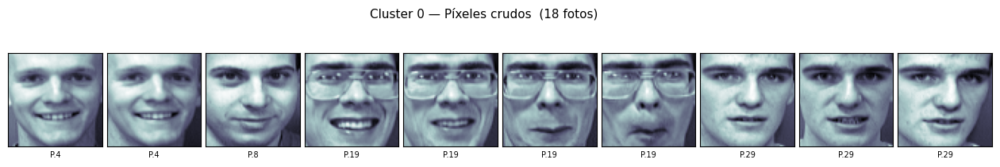

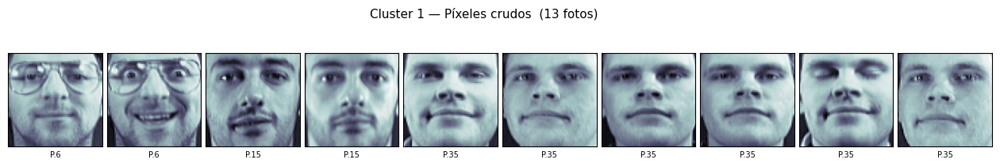

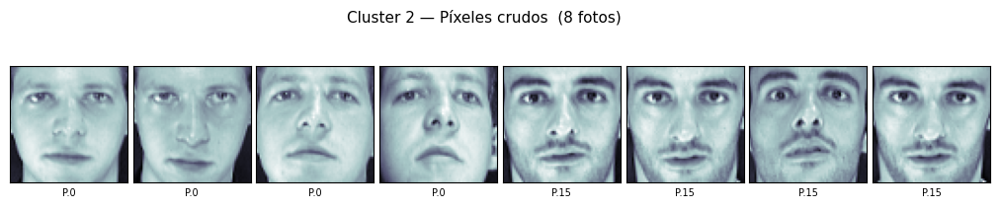

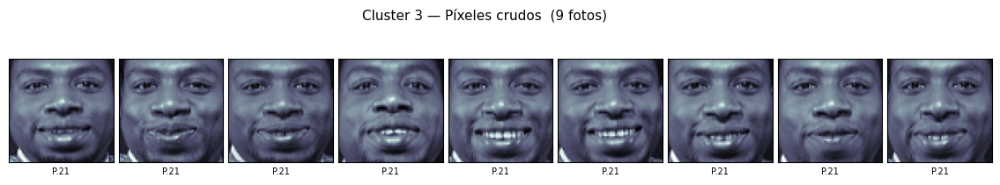

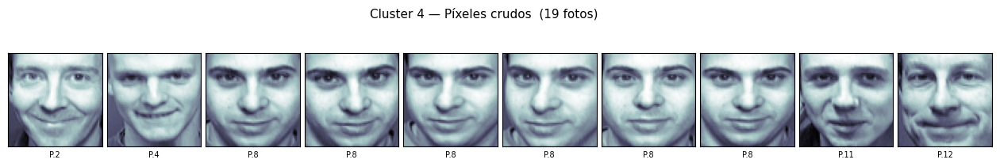

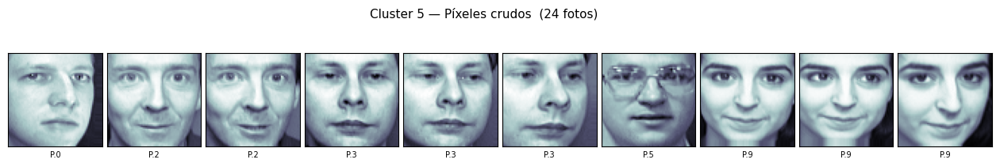

In [18]:
# Mostramos los primeros 6 clusters
caras_2d = data_olivetti.reshape(-1, 64, 64)

for cid in range(6):
    idx    = np.where(kmeans_pix.labels_ == cid)[0]
    n_show = min(10, len(idx))
    fig, axes = plt.subplots(1, n_show,
                             figsize=(n_show * 1.6, 2.4),
                             subplot_kw={'xticks': [], 'yticks': []},
                             gridspec_kw={'wspace': 0.05})
    fig.suptitle(f'Cluster {cid} — Píxeles crudos  ({len(idx)} fotos)', fontsize=11)
    if n_show == 1:
        axes = [axes]
    for j, ax in enumerate(axes):
        ax.imshow(caras_2d[idx[j]], cmap='bone')
        ax.set_xlabel(f'P.{targets_olivetti[idx[j]]}', fontsize=7)
    plt.show()

### 2.2 K-Means sobre embeddings CLIP

Para usar CLIP con las caras Olivetti necesitamos dos pasos previos:
1. Convertir cada imagen de escala de grises a **RGB** (CLIP fue entrenado con imágenes a color)
2. El processor de CLIP se encarga de redimensionar a 224×224 internamente

In [19]:
# Convertimos las imágenes Olivetti a PIL RGB
print('Convirtiendo imágenes Olivetti a RGB...')
olivetti_pil = []
for i in range(data_olivetti.shape[0]):
    arr = (data_olivetti[i].reshape(64, 64) * 255).astype(np.uint8)
    img = Image.fromarray(arr, mode='L').convert('RGB')
    olivetti_pil.append(img)
print(f'  {len(olivetti_pil)} imágenes listas\n')

# Extraemos embeddings (~1-2 minutos en CPU)
embeddings_olivetti = extraer_embeddings(
    olivetti_pil, clip_processor, clip_model, device
)
print(f'\nMatriz de embeddings Olivetti: {embeddings_olivetti.shape}')

Convirtiendo imágenes Olivetti a RGB...
  400 imágenes listas



Extrayendo embeddings:   0%|          | 0/25 [00:00<?, ?it/s]

Extrayendo embeddings:   4%|▍         | 1/25 [00:00<00:15,  1.59it/s]

Extrayendo embeddings:   8%|▊         | 2/25 [00:01<00:14,  1.58it/s]

Extrayendo embeddings:  12%|█▏        | 3/25 [00:01<00:13,  1.61it/s]

Extrayendo embeddings:  16%|█▌        | 4/25 [00:02<00:13,  1.60it/s]

Extrayendo embeddings:  20%|██        | 5/25 [00:03<00:12,  1.59it/s]

Extrayendo embeddings:  24%|██▍       | 6/25 [00:04<00:14,  1.33it/s]

Extrayendo embeddings:  28%|██▊       | 7/25 [00:05<00:14,  1.21it/s]

Extrayendo embeddings:  32%|███▏      | 8/25 [00:05<00:14,  1.20it/s]

Extrayendo embeddings:  36%|███▌      | 9/25 [00:06<00:14,  1.11it/s]

Extrayendo embeddings:  40%|████      | 10/25 [00:07<00:13,  1.15it/s]

Extrayendo embeddings:  44%|████▍     | 11/25 [00:08<00:12,  1.13it/s]

Extrayendo embeddings:  48%|████▊     | 12/25 [00:09<00:12,  1.04it/s]

Extrayendo embeddings:  52%|█████▏    | 13/25 [00:10<00:11,  1.06it/s]

Extrayendo embeddings:  56%|█████▌    | 14/25 [00:11<00:10,  1.06it/s]

Extrayendo embeddings:  60%|██████    | 15/25 [00:12<00:09,  1.07it/s]

Extrayendo embeddings:  64%|██████▍   | 16/25 [00:13<00:08,  1.03it/s]

Extrayendo embeddings:  68%|██████▊   | 17/25 [00:14<00:08,  1.01s/it]

Extrayendo embeddings:  72%|███████▏  | 18/25 [00:15<00:06,  1.09it/s]

Extrayendo embeddings:  76%|███████▌  | 19/25 [00:16<00:05,  1.09it/s]

Extrayendo embeddings:  80%|████████  | 20/25 [00:17<00:04,  1.01it/s]

Extrayendo embeddings:  84%|████████▍ | 21/25 [00:18<00:03,  1.08it/s]

Extrayendo embeddings:  88%|████████▊ | 22/25 [00:19<00:02,  1.05it/s]

Extrayendo embeddings:  92%|█████████▏| 23/25 [00:20<00:01,  1.04it/s]

Extrayendo embeddings:  96%|█████████▌| 24/25 [00:21<00:00,  1.07it/s]

Extrayendo embeddings: 100%|██████████| 25/25 [00:21<00:00,  1.12it/s]

Extrayendo embeddings: 100%|██████████| 25/25 [00:21<00:00,  1.14it/s]


Matriz de embeddings Olivetti: (400, 512)


In [20]:
# Mismo código, distinto input
kmeans_emb = KMeans(n_clusters=40, random_state=42, n_init=10)
kmeans_emb.fit(embeddings_olivetti)

ari_embeddings = adjusted_rand_score(targets_olivetti, kmeans_emb.labels_)
print(f'K-Means sobre embeddings CLIP — Olivetti')
print(f'  ARI = {ari_embeddings:.4f}   (1.0 = perfecto, 0.0 = aleatorio)')

K-Means sobre embeddings CLIP — Olivetti
  ARI = 0.7054   (1.0 = perfecto, 0.0 = aleatorio)


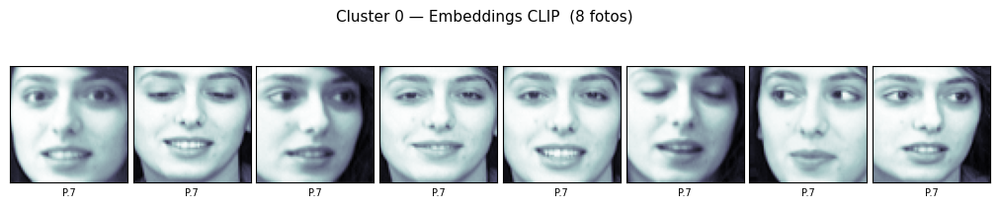

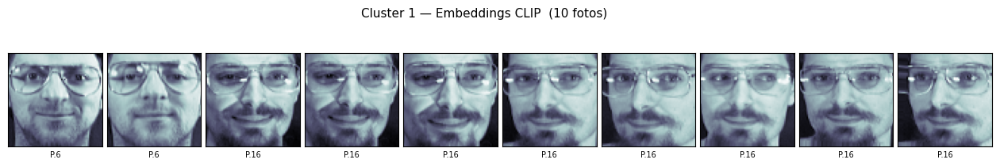

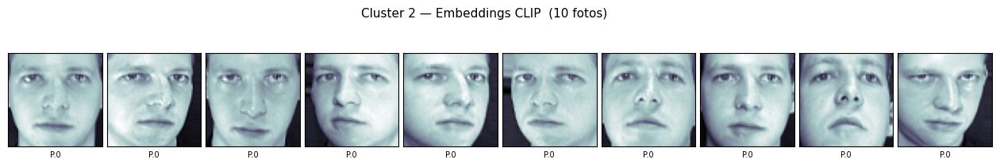

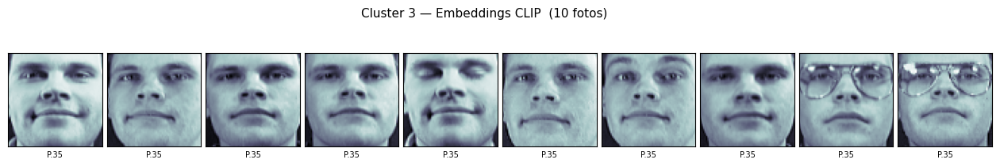

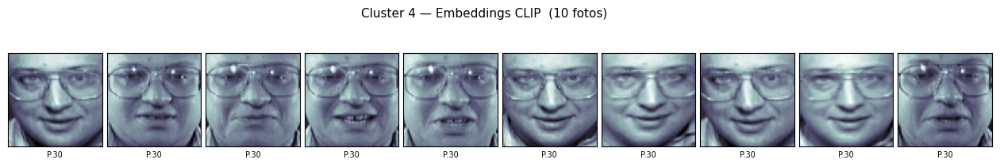

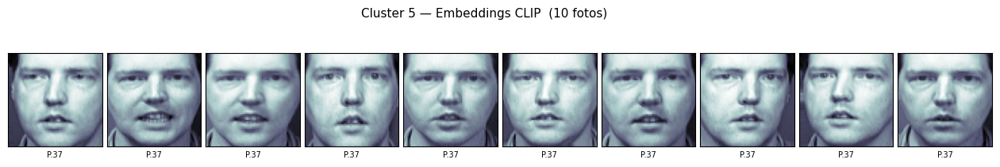

In [21]:
# Mostramos los primeros 6 clusters con embeddings
for cid in range(6):
    idx    = np.where(kmeans_emb.labels_ == cid)[0]
    n_show = min(10, len(idx))
    fig, axes = plt.subplots(1, n_show,
                             figsize=(n_show * 1.6, 2.4),
                             subplot_kw={'xticks': [], 'yticks': []},
                             gridspec_kw={'wspace': 0.05})
    fig.suptitle(f'Cluster {cid} — Embeddings CLIP  ({len(idx)} fotos)', fontsize=11)
    if n_show == 1:
        axes = [axes]
    for j, ax in enumerate(axes):
        ax.imshow(caras_2d[idx[j]], cmap='bone')
        ax.set_xlabel(f'P.{targets_olivetti[idx[j]]}', fontsize=7)
    plt.show()

### 2.3 Comparación lado a lado

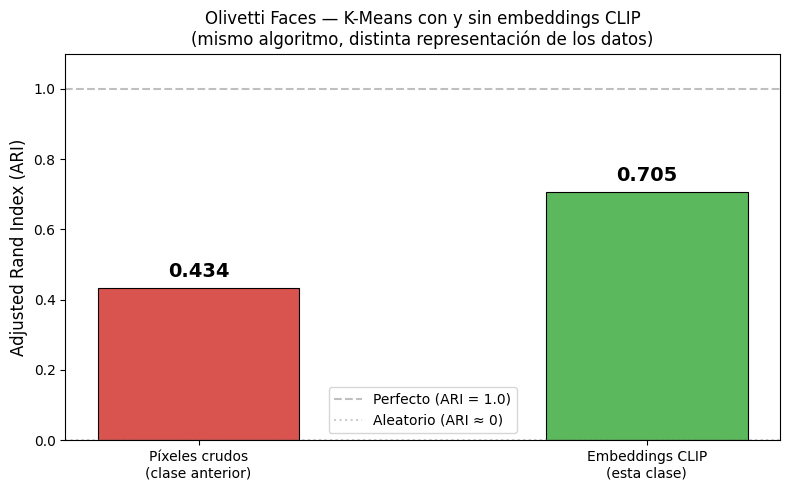


Mejora: +0.2711 puntos de ARI


In [22]:
fig, ax = plt.subplots(figsize=(8, 5))

metodos     = ['Píxeles crudos\n(clase anterior)', 'Embeddings CLIP\n(esta clase)']
aris        = [ari_pixeles, ari_embeddings]
colores_bar = ['#d9534f', '#5cb85c']

bars = ax.bar(metodos, aris, color=colores_bar,
              width=0.45, edgecolor='black', linewidth=0.8)
ax.set_ylim(0, 1.1)
ax.set_ylabel('Adjusted Rand Index (ARI)', fontsize=12)
ax.set_title('Olivetti Faces — K-Means con y sin embeddings CLIP\n'
             '(mismo algoritmo, distinta representación de los datos)',
             fontsize=12)

for bar, ari in zip(bars, aris):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.02,
            f'{ari:.3f}', ha='center', va='bottom',
            fontsize=14, fontweight='bold')

ax.axhline(y=1.0, linestyle='--', color='gray', alpha=0.5, label='Perfecto (ARI = 1.0)')
ax.axhline(y=0.0, linestyle=':',  color='gray', alpha=0.4, label='Aleatorio (ARI ≈ 0)')
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

print(f'\nMejora: {ari_embeddings - ari_pixeles:+.4f} puntos de ARI')

---
## Resumen

| | Representación | Dimensiones | ARI (Olivetti) |
|---|---|---|---|
| **Clase anterior** | Píxeles crudos | 4.096 | bajo |
| **Esta clase** | Embedding CLIP | 512 | alto |

### Conceptos clave

- **Embedding**: vector numérico que representa el *significado* de una imagen, no sus píxeles.
- **Red pre-entrenada**: CLIP aprendió a separar conceptos visuales con millones de imágenes. Nosotros solo la usamos para extraer vectores.
- **El algoritmo K-Means no cambió**. Lo que cambió fue cómo representamos los datos.
- **Todo puede convertirse en un vector latente**: imágenes, texto, audio, código fuente. Una vez que tienes vectores, puedes medir distancias y aplicar clustering.

### Funciones clave utilizadas

```python
from transformers import CLIPProcessor, CLIPModel

processor = CLIPProcessor.from_pretrained('openai/clip-vit-base-patch32')
model     = CLIPModel.from_pretrained('openai/clip-vit-base-patch32')

# Para una imagen PIL:
inputs = processor(images=img, return_tensors='pt')
with torch.no_grad():
    embedding = model.get_image_features(**inputs)
    embedding = embedding / embedding.norm(dim=-1, keepdim=True)  # normalizar

# Adjusted Rand Index:
from sklearn.metrics import adjusted_rand_score
ari = adjusted_rand_score(etiquetas_reales, etiquetas_kmeans)
```